
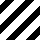
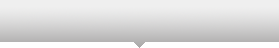
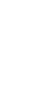
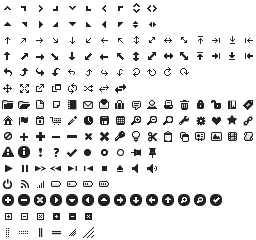
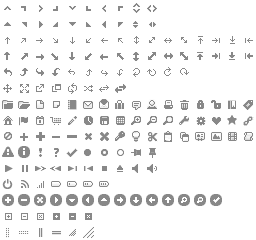
...
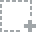
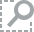
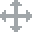
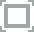
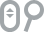

In [3]:
import math
import numpy as np
import soundfile as sf
from scipy import fftpack, signal

import bokeh.plotting as plt
import IPython.display
import markdown2
from bokeh.models import Range1d
from bokeh.plotting import ColumnDataSource

def display(text):
    IPython.display.display(IPython.display.HTML(markdown2.markdown(text)))

plt.output_notebook()

In [4]:
def make_plot(t, x, title, width=700, height=350):
    fig = plt.figure(title=title, tools='save', plot_width=width, plot_height=height)
    fig.line(t, x)
    return fig

In [5]:
file_path = 'data/LibriSpeech/dev-clean/1272/128104/1272-128104-0000.flac'
plot_rate = 10

display("## Basic IO")

x, data_rate = sf.read(file_path)
t = np.linspace(0, len(x) / data_rate, len(x))
fig = make_plot(t[::plot_rate], x[::plot_rate], title='Waveform Sampled at {} Hz'.
    format(data_rate // plot_rate))
plt.show(fig)

In [6]:
spectogram_colors = ['#f7f4f9', '#e7e1ef', '#d4b9da', '#c994c7', '#df65b0', '#e7298a',
    '#ce1256', '#980043', '#67001f']

def make_spectogram(X, window_stride_ms, title):
    assert len(X.shape) == 2
    window_count, window_length = X.shape[0], X.shape[1]
    
    log_X = np.log(np.ravel(X))
    times = np.repeat(window_stride_ms / 1000 * np.arange(0, window_count), window_length)
    assert len(times) == len(log_X)
    
    spec_min, spec_max = np.min(log_X), np.max(log_X)
    a = (len(spectogram_colors) - 1) / (spec_max - spec_min)
    b = -a * spec_min

    bins = np.tile(np.arange(0, window_length), window_count)
    bin_colors = [spectogram_colors[int(round(a * s + b))] for s in log_X]
    source = ColumnDataSource(data=dict(times=times, bins=bins, colors=bin_colors))

    fig = plt.figure(title=title, x_range=Range1d(0, times[-1] + (window_stride_ms - 1) / 1000),
        y_range=Range1d(0, window_length - 1), x_axis_label='Time (seconds)',
        y_axis_label='Frequency Bin', plot_width=900, plot_height=450, tools='save')

    fig.grid.grid_line_color = None
    fig.axis.axis_line_color = None
    fig.axis.major_tick_line_color = None
    fig.rect('times', 'bins', window_stride_ms / 1000, 1, source=source, color='colors')
    return fig

In [7]:
def make_histogram(X, title, bins=50):
    hist, edges = np.histogram(np.ravel(np.log(X)), density=True, bins=bins)
    fig = plt.figure(title=title, tools='save', plot_width=900, plot_height=450)
    fig.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], color='#3182bd', line_color=None)
    return fig

In [8]:
window_dur_ms = 20
window_stride_ms = 10

window_length = data_rate * window_dur_ms // 1000
window_stride = data_rate * window_stride_ms // 1000
print("Window length: {}; window stride: {}.".format(window_length, window_stride))

rev_window = np.hamming(window_length)[::-1]
window_buffer = np.empty(window_length)
window_count = len(x) // window_stride + 1

dft_length = window_length // 2 + 1
st_dft = np.empty((window_count, dft_length))
st_dct = np.empty((window_count, window_length))

def expand_dft(s):
    if window_length % 2 == 0:
        return np.concatenate((s, s[1:-1][::-1]))
    else:
        return np.concatenate((s, s[1:][::-1]))

for i, a in enumerate(range(0, len(x), window_stride)):
    b = min(a + window_length, len(x))
    np.copyto(dst=window_buffer[:b - a], src=x[a:b])
    
    # We choose to zero-pad the last window if necessary, rather than discard it.
    window_buffer[b:] = 0
    window_buffer = window_buffer * rev_window
    
    """
    To show a full period of the DFT, use the following:
    
        expand_dft(np.abs(np.fft.rfft(window_buffer)))
        
    We choose not to do this, in order to enable a more direct comparison to the DCT.
    """
    st_dft[i] = np.abs(np.fft.rfft(window_buffer))
    st_dct[i] = np.abs(fftpack.dct(window_buffer))
    
display("""
## Short-Term Transforms

Let $N$ be the window length, and let $F : [0, N - 1] \\to \\mathbb{C}$ and
$C : [0, N - 1] \\to \\mathbb{R}$ denote the DFT and DCT of the windowed signal, respectively.
It is straightforward to show that the following relationship between $F$ and $C$ holds:

$$
    F(k) = \exp\\left(\\frac{i \pi k}{2N}\\right) \; C(k), \\quad\\text{or}\\quad
    C(k) = \exp\\left(-\\frac{i \pi k}{2N}\\right) \; F(k).
$$

The DCT tends to allocate more of the total energy to a smaller frequency band, owing to the
factor of $\exp(-i \pi k / 2N)$ in its relationship to the DFT. Indeed, the tone of the DCT
spectogram is darker than that of the DFT spectogram, since the left tail of the DCT magnitude
histogram is thinner. We can also see that the mode of the DCT histogram is narrower than that
of the DFT histogram. These features of the DCT representation demonstrate its "energy
compactification" properties. 
""")

hist_1 = make_histogram(st_dft, 'Log DFT Magnitudes')
hist_2 = make_histogram(st_dct, 'Log DCT Magnitudes')

plt.show(hist_1)
plt.show(hist_2)
    
spec_1 = make_spectogram(st_dft, window_stride_ms, 'DFT Spectogram')
spec_2 = make_spectogram(st_dct, window_stride_ms, 'DCT Spectogram')

plt.show(spec_1)
plt.show(spec_2)

Window length: 320; window stride: 160.


In [9]:
def to_decibels(X):
    return 20 * np.log10(X / np.max(X))

def make_truncated_sinc(freq, start, end, nyquist_freq):
    assert freq > 0
    assert end > start
    assert nyquist_freq > 0
    
    sample_period = 1 / nyquist_freq
    t = np.arange(start, end + sample_period, sample_period)
    x = freq / math.pi * np.sinc(freq * t)
    return t, x
t
def make_band_pass_filter_1(f_start, f_stop, nyquist_freq, sample_count, beta=4.864):
    assert f_stop > f_start
    assert sample_count > 0
    assert nyquist_freq > 0
    
    sample_period = 1 / nyquist_freq
    extent = sample_period * (sample_count - 1) / 2
    t = np.arange(-extent, extent + sample_period, sample_period)
    
    if len(t) > sample_count:
        t = t[:-1]
    
    f2 = f_stop / math.pi * np.sinc(f_stop * t)
    f1 = f_start / math.pi * np.sinc(f_start * t)
    w = np.kaiser(sample_count, beta)
    return t, w * (f2 - f1)

display("""
## The Window Design Method

Observe the dent in the left edge of frequency-response of the band-pass filter. This issue
is explained in more detail in the next cell, and warrants the use of modulation.
""")
    
start, stop = -0.01, 0.01
nyquist_freq = data_rate / 2

t, x = make_truncated_sinc(1000, start, stop, nyquist_freq)
fig_1 = make_plot(t, x, title='Truncated Sinc')
plt.show(fig_1)

X = np.abs(signal.freqz(x)[1])
resp_count = len(X)
f = nyquist_freq / resp_count * np.arange(0, resp_count)
fig_2 = make_plot(f, X, title='Frequency Response of Truncated Sinc')
plt.show(fig_2)

nyquist_freq = 6660 / 2
sample_count = 101
t, x = make_band_pass_filter_1(500, 3000, nyquist_freq, sample_count)
fig_3 = make_plot(t, x, title='Truncated Sinc')
plt.show(fig_3)

X = np.abs(signal.freqz(x)[1])
resp_count = len(X)
f = nyquist_freq / resp_count * np.arange(0, resp_count)
fig_3 = make_plot(f, to_decibels(X), title='Frequency Response of Truncated Sinc')
plt.show(fig_3)

In [122]:
"""
Approximation to the ideal band-pass filter for the range `[start, end]`.
"""
def make_band_pass_filter_2(f_start, f_stop, sample_freq, length):
    assert f_start >= 0
    assert f_stop <= max_freq
    assert sample_freq % 2 == 0
    
    nyq = sample_freq / 2
    f_max = nyq if nyq % 2 == 0 else nyq + 1
    bands = np.arange(0, nyq)
    resp = np.zeros_like(bands)
    resp[f_start:f_stop + 1] = 1
    
    return signal.firls(length, bands=bands, desired=resp, nyq=nyq)

def make_uniform_window_sequence(filter_count, max_freq, sample_freq, window_length,
    beta=4.864, delta_l=0, delta_r=0, verbose=False):
    
    assert filter_count >= 1
    assert max_freq >= 1 and max_freq % 2 == 0
    assert sample_freq % 2 == 0
    
    assert beta > 0
    assert delta_l >= 0
    assert delta_r >= 0
    
    delta_l = delta_l
    delta_r = delta_r
    filter_stride = (max_freq - (delta_l + delta_r)) / (filter_count + 1)
    filter_width = filter_stride + 1
    
    filters = []
    
    """
    Used for constructing the low-pass filters using `firls`, which was abandoned in favor
    of the window design method.
    
    window = np.kaiser(window_length, 4.864)
    """
    
    nyquist_freq = sample_freq / 2
    base_offset = nyquist_freq / 2
    start_offset_1 = base_offset - (filter_width - 1)
    start_offset_2 = base_offset
    
    t, f_1 = make_band_pass_filter_1(
        f_start=start_offset_1,
        f_stop=base_offset,
        nyquist_freq=nyquist_freq,
        sample_count=window_length,
        beta=beta
    )
    
    _, f_2 = make_band_pass_filter_1(
        f_start=start_offset_2,
        f_stop=start_offset_2 + (filter_width - 1),
        nyquist_freq=nyquist_freq,
        sample_count=window_length,
        beta=beta
    )
    
    """
    base_offset = math.ceil(0.6 * nyquist_freq) - filter_width + 1
    
    t, f = make_band_pass_filter_1(
        f_start=base_offset,
        f_stop=math.ceil(0.6 * nyquist_freq),
        nyquist_freq=nyquist_freq,
        sample_count=window_length
    )
    """
    
    if verbose:
        display("Frequency bins:")
    
    for i in range(1, filter_count + 1):
        center = delta_l + i * filter_stride
        offset_left = (filter_width - 1) / 2
        offset_right = offset_left
        cur_left = center - offset_left
        
        if verbose:
            display("- Bin {}: center: {}; $f\\_\\text{{min}}$: {}; $f\\_\\text{{max}}$: {}."
                .format(i, center, center - offset_left, center + offset_right))
        
        if center < base_offset - math.ceil((filter_width - 1) // 2):
            filters.append(f_1 * np.exp(math.pi * (cur_left - start_offset_1) * 1j * t))
        else:
            filters.append(f_2 * np.exp(math.pi * (cur_left - start_offset_2) * 1j * t))
        
        """
        Used for constructing the low-pass filters using `firls`, which was abandoned in favor
        of the window design method.
        
        f = make_band_pass_filter_2(
            f_start=center - offset_left,
            f_stop=center + offset_right,
            sample_freq=sample_freq,
            length=window_length
        )
        
        filters.append(f * window)
        """
        
    return filters

filter_count = 15
window_length = 101
sample_freq = 6660
nyquist_freq = sample_freq / 2

filters = make_uniform_window_sequence(filter_count, nyquist_freq, sample_freq, window_length,
    beta=4.864, delta_l=5, delta_r=12, verbose=True)

responses = [np.abs(signal.freqz(f)[1]) for f in filters]
fig_1 = plt.figure(title='Individual Window Responses', tools='save', plot_width=900, plot_height=450)

resp_count = len(responses[0])
freqs = nyquist_freq / resp_count * np.arange(0, resp_count)

for resp in responses:
    fig_1.line(x=freqs, y=to_decibels(resp))

cum_filter = np.zeros(window_length)

for f in filters:
    cum_filter = cum_filter + f
    
cum_filter = cum_filter / 2
fig_2 = plt.figure(title='Overall Response', tools='save', plot_width=900, plot_height=450)
fig_2.line(x=freqs, y=to_decibels(np.abs(signal.freqz(cum_filter)[1])))

display("""
## Window Sequences

There are several hacks required to get the overall frequency-response of the filter bank to
be flat, smooth, and symmetric. The motivation behind these hacks is given in the observations
below.

- There are two main ways to create low-pass filters: those based on the window design method
  (advocated by Rabiner), and those based on procedures that construct filters by optimizing
  some desired criteria. While the results of the window design method are difficult to
  predict, the resulting low-pass filters tend to be flatter over the required frequency band
  and decay to zero more rapidly than those obtained using other methods.
- The window design method requires obtaining a truncated approximation of the sinc function.
  If we truncate the ideal low-pass filter for a frequency that is small in comparison to the
  Nyquist frequency, then we will cut off the sinc function in the time-domain before it has
  a chance to "spread" very far from the origin in either direction. Consequently, the
  frequency-response of the filter will have a "dent" where it is cut off near the origin. The
  solution to this problem is to first compute the smoothed band-pass filter of the desired
  width at a higher frequency (e.g. with the right edge at one-fourth the Nyquist frequency),
  and then modulate it to bring it to the desired location.
- Using the modulation trick described above would allow us to make all of the filters in the
  bank symmetric. But there is a caveat to this approach. Recall that a filter's response to
  the frequency range $[f\\_\\text{Nyquist}, 2 f\\_\\text{Nyquist} - 1]$ is the reflection of
  its response to the range $[0, f\\_\\text{Nyquist} - 1]$. Hence, a bandpass filter actually
  has two "bumps" over the range $[0, 2 f\\_\\text{Nyquist} - 1]$. If we attempt to create all
  of the filters in the bank by modulating the same prototype band pass filter, then we will
  find that some of the resulting filters have two "bumps" in the range
  $[0, f\\_\\text{Nyquist} - 1]$. This is because modulating a filter can move both bumps into
  the same frequency range. This is why we use two prototype filters in this implementation,
  one for filters in the range $[0, f\\_\\text{Nyquist} / 2 - 1]$, and another for filters in
  the range $[f\\_\\text{Nyquist} / 2, f\\_\\text{Nyquist} - 1]$.
- For reasons I did not work out, the leftmost and rightmost filters are not positioned exactly
  such that the main lobe of the former is cut off from the left at $f = 0$ and the main lobe of
  the latter from the right at $f = f\\_\\text{Nyquist}$. The `delta_l` and `delta_r` parameters
  serve to move around the left and rightmost filters so that they are in their optimal
  positions. The frequency range is reduced slightly in order to compensate for this.
- The overall response is flatter and smoother with `filter_width = round(filter_stride) + 1`
  rather than `filter_width = round(filter_stride)`. Again, I did not bother to investigate why.
""")

plt.show(fig_1)
plt.show(fig_2)

In [11]:
filter_count = 15
window_length = 101
sample_freq = 6660
nyquist_freq = sample_freq / 2

filters = make_uniform_window_sequence(filter_count, nyquist_freq, sample_freq, window_length,
    beta=4.864, delta_l=5, delta_r=12)

f = filters[0]
t = 1 / sample_freq * np.arange(0, len(f))

F = signal.freqz(f)[1]
resp_count = len(F)
freqs = nyquist_freq / resp_count * np.arange(0, resp_count)

f_2 = np.fft.irfft(np.abs(np.fft.fft(f)), len(f))
F_2 = signal.freqz(f_2)[1]

display("""
## A Note on Modulation

In the cell above, we create the bandpass filter for each frequency bin by shifting a prototype
filter to the desired frequency band using modulation. This has the undesirable effect of making
the the shifted version of the prototype filter complex. To see why, consider the frequency
response of the original real filter over $[0, 2 \\pi)$. The response is symmetric, and has two
peaks -- one in $[0, \\pi)$, and another in $[\\pi, 2 \\pi)$. When we modulate the prototype, we
circularly shift the frequency response, moving around both peaks in the process. Consequently,
the spectrum in no longer symmetric, implying that the modulated filter is no longer real.

We can attempt to "symmetrize" the modulated filter, in order to obtain a new, real filter with
an identical frequency response over $[0, \\pi)$. This is accomplished by applying the inverse
DFT to the magnitude of the DFT of the modulated filter. This process essentially removes the
second peak of the modulated filter in $[\\pi, 2 \\pi)$, replacing it with a reflected copy of
the first peak. However, the inverse DFT only guarantees that the returned signal will match the
frequency response of the original **at the same sample points.** The frequency response of this
new "symmetrized" filter will in fact not be the same as the original on $[0, \\pi)$; this is
shown in the plots below.

To circumvent these issues in practice, we do not convolve the signal with the complex modulated
filters. Instead, we mulitply the DFT of the signal with the _magnitude_ of the DFTs of the
filters, and then apply the inverse DFT to the result in order to perform further processing.
""")

fig_1 = plt.figure(title='Original DFT', tools='save', plot_width=900, plot_height=450)
fig_1.line(x=freqs, y=np.abs(F))
plt.show(fig_1)

fig_2 = plt.figure(title='Symmetrized Filter', tools='save', plot_width=900, plot_height=450)
fig_2.line(x=t, y=f_2)
plt.show(fig_2)

fig_3 = plt.figure(title='New DFT', tools='save', plot_width=900, plot_height=450)
fig_3.line(x=freqs, y=np.abs(F_2))
plt.show(fig_3)

In [91]:
"""
TODO: generalize to arbitrary spacings (uniform, octave, critical band, etc.) and arbitrary
window types (e.g. Kaiser-smoothed low-pass, triangular, etc.). Then change the name of the
function to `make_filter_bank`.
"""
def make_uniform_filter_bank(filter_count, max_freq, sample_freq, window_length,
    beta=4.864, delta_l=0, delta_r=0):  
    
    assert filter_count >= 1
    assert max_freq >= 1 and max_freq % 2 == 0
    assert sample_freq % 2 == 0
    
    assert beta > 0
    assert delta_l >= 0
    assert delta_r >= 0
    
    delta_l = delta_l
    delta_r = delta_r
    filter_stride = (max_freq - (delta_l + delta_r)) / (filter_count + 1)
    filter_width = filter_stride + 1
    
    nyquist_freq = sample_freq / 2
    base_offset = nyquist_freq / 2
    start_offset_1 = base_offset - (filter_width - 1)
    start_offset_2 = base_offset
    
    t, f_1 = make_band_pass_filter_1(
        f_start=start_offset_1,
        f_stop=base_offset,
        nyquist_freq=nyquist_freq,
        sample_count=window_length,
        beta=beta
    )
    
    _, f_2 = make_band_pass_filter_1(
        f_start=start_offset_2,
        f_stop=start_offset_2 + (filter_width - 1),
        nyquist_freq=nyquist_freq,
        sample_count=window_length,
        beta=beta
    )
    
    filters = []
    
    for i in range(1, filter_count + 1):
        center = delta_l + i * filter_stride
        offset = (filter_width - 1) / 2
        cur_left = center - offset
        
        if center < base_offset - math.ceil((filter_width - 1) // 2):
            filters.append(f_1 * np.exp(math.pi * (cur_left - start_offset_1) * 1j * t))
        else:
            filters.append(f_2 * np.exp(math.pi * (cur_left - start_offset_2) * 1j * t))
    
    return filters

filter_count = 40
window_length = 320
sample_freq = data_rate
nyquist_freq = sample_freq / 2

filters = make_uniform_filter_bank(filter_count, nyquist_freq, sample_freq, window_length,
    beta=6, delta_l=2.5, delta_r=17)

responses = [np.abs(signal.freqz(f)[1]) for f in filters]
fig_1 = plt.figure(title='Individual Window Responses', tools='save', plot_width=900, plot_height=450)

resp_count = len(responses[0])
freqs = nyquist_freq / resp_count * np.arange(0, resp_count)

for resp in responses:
    fig_1.line(x=freqs, y=to_decibels(resp))
    
cum_filter = np.zeros(window_length)

for f in filters:
    cum_filter = cum_filter + f
    
cum_filter = cum_filter / 2
fig_2 = plt.figure(title='Overall Response', tools='save', plot_width=900, plot_height=450)
fig_2.line(x=freqs, y=to_decibels(np.abs(signal.freqz(cum_filter)[1])))

plt.show(fig_1)
plt.show(fig_2)

In [13]:
from bokeh.io import hplot, vplot
from bokeh.models import PrintfTickFormatter

def apply_filter_bank(filters, stride, x):
    channels = len(filters)
    assert channels > 0
    assert stride > 0
    
    chunk_size = len(filters[0])
    for f in filters[1:]:
        assert len(f) == chunk_size
    
    responses = [np.fft.rfft(f) for f in filters]
    chunk_buffer = np.empty((chunk_size))
    chunk_count = len(x) // stride + 1
    features = np.empty((chunk_count, channels, chunk_size // 2 + 1))
    
    for i, a in enumerate(range(0, len(x), stride)):
        b = min(a + chunk_size, len(x))
        np.copyto(dst=chunk_buffer[:b - a], src=x[a:b])
    
        # We choose to zero-pad the last window if necessary, rather than discard it.
        chunk_buffer[b:] = 0
        S = np.fft.rfft(chunk_buffer)
        
        for j, resp in enumerate(responses):
            features[i][j] = S * resp
            
    return features

x, data_rate = sf.read(file_path)

filter_count = 40
window_length = 320
window_stride = 160
sample_freq = data_rate
nyquist_freq = sample_freq / 2

filters = make_uniform_filter_bank(filter_count, nyquist_freq, sample_freq, window_length,
    beta=6, delta_l=2, delta_r=17)
features = apply_filter_bank(filters, window_stride, x)

display("""
## Visualization of Channels in Filter Bank

Note: each horizontal plot is actually scrollable; just try to scroll by swiping in the
blank region above each horizontal plot. 
""")

t = np.linspace(0, window_stride / data_rate, window_stride)

def format_plot(plot):
    plot.xaxis.formatter = PrintfTickFormatter(format='%4.1e')
    plot.yaxis.formatter = PrintfTickFormatter(format='%4.1e')
    plot.title_text_font_size = '12pt'
    plot.xaxis.major_label_text_font_size = '6pt'
    plot.yaxis.major_label_text_font_size = '6pt'
    return plot

for i, a in enumerate(range(0, len(x), 100 * window_stride)):
    figs = []
    
    def add_plot(*args, **kwargs):
        figs.append(format_plot(make_plot(*args, **kwargs)))
        
    add_plot(t, x[a:a + window_stride], width=300, height=150,
        title='Speech at {} Seconds'.format(a / data_rate))
        
    for j in range(0, filter_count, 8):
        add_plot(t, np.fft.irfft(a=features[50 * i][j], n=window_length),
            width=300, height=150, title='Channel {}'.format(j + 1))
    
    plt.show(vplot(hplot(*figs)))

"""
TODO:
- Compare Kaiser-smoothed low-pass and triangular windows. Verify that the triangular windows
  yield a flat overall frequency-response.
- If the efficient implementation is necessary, write a function to compute the uniformly-spaced
  filters that returns a single window and a list of frequency offsets instead of a list of
  filters. But what about the aliasing issue that occurs after modulation? Don't we need more than
  one prototype filter?
"""

/opt/local/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/numpy/fft/fftpack.py:365: ComplexWarning: Casting complex values to real discards the imaginary part
  a = array(a, copy=True, dtype=float)
/opt/local/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/IPython/kernel/__main__.py:27: ComplexWarning: Casting complex values to real discards the imaginary part


"\nTODO:\n- Compare Kaiser-smoothed low-pass and triangular windows. Verify that the triangular windows\n  yield a flat overall frequency-response.\n- If the efficient implementation is necessary, write a function to compute the uniformly-spaced\n  filters that returns a single window and a list of frequency offsets instead of a list of\n  filters. But what about the aliasing issue that occurs after modulation? Don't we need more than\n  one prototype filter?\n"

In [275]:
def generate_sample_points(nyquist_freq, sample_count):
    sample_period = 1 / nyquist_freq
    extent = sample_period * (sample_count - 1) / 2
    t = np.arange(-extent, extent + sample_period, sample_period)

    """
    Due to rounding issues, the right endpoint is sometimes an overestimate of the
    exact value, leading to an extra sample point. Is there a more elegant way to
    deal with this?
    """
    if len(t) > sample_count:
        t = t[:-1]
        
    return t
  
def make_band_pass_filter_1(f_start, f_stop, nyquist_freq, sample_count, beta=4.864):
    assert f_stop > f_start
    assert sample_count > 0
    assert nyquist_freq > 0
    
    sample_period = 1 / nyquist_freq
    extent = sample_period * (sample_count - 1) / 2
    t = np.arange(-extent, extent + sample_period, sample_period)
    
    if len(t) > sample_count:
        t = t[:-1]
    
    f2 = f_stop / math.pi * np.sinc(f_stop * t)
    f1 = f_start / math.pi * np.sinc(f_start * t)
    w = np.kaiser(sample_count, beta)
    return t, w * (f2 - f1)    

def make_rabiner_band_pass_filter(f_start, f_center, f_stop, nyquist_freq, sample_count, beta=4.864):
    assert f_stop > f_center > f_start >= 0
    assert nyquist_freq > 0
    assert sample_count > 0
    assert beta > 0
    
    filter_width = f_stop - f_start + 1
    base_center = nyquist_freq / 2
    base_offset = (filter_width - 1) / 2
    base_start = base_center - base_offset
    base_stop = base_center + base_offset
    
    t = generate_sample_points(nyquist_freq, sample_count)
    f_2 = base_stop / math.pi * np.sinc(base_stop * t)
    f_1 = base_start / math.pi * np.sinc(base_start * t)
    w = np.kaiser(sample_count, beta)
    
    F = np.abs(np.fft.fft(w * (f_2 - f_1) * np.exp(math.pi * (f_start - base_start) * 1j * t)))
    
    #step = 2 * nyquist_freq / (sample_count - 1)
    # We zero out the response for any frequency above the Nyquist frequency.
    #F[math.ceil(nyquist_freq / step):] = 0
    return F

def make_triangular_band_pass_filter(f_start, f_center, f_stop, nyquist_freq, sample_count):
    assert f_stop > f_center > f_start >= 0
    assert nyquist_freq > 0
    assert sample_count > 0
    
    freqs = np.linspace(0, 2 * nyquist_freq, sample_count)
    step = 2 * nyquist_freq / (sample_count - 1)
    
    """
    Since `f_start`, `f_center`, and `f_stop` likely to do not coincide with grid points, the
    filter's response will never reach one or decay to zero symmetrically on both sides. To
    circumvent this issue, we parameterize the triangular curve using the grid points closest 
    to the specified values, rather than the specified values themselves.
    """
    f_l, f_c, f_r = [step * round(f / step) for f in [f_start, f_center, f_stop]]
    
    for f in [f_l, f_c, f_r]:
        assert f in freqs
    
    a_1, b_1 = 1 / (f_c - f_l), -f_l / (f_c - f_l)
    a_2, b_2 = -1 / (f_r - f_c), f_r / (f_r - f_c)
    
    def tent(f):
        if f <= f_l or f >= f_r:
            return 0
        elif f > f_l and f <= f_c:
            return a_1 * f + b_1
        else:
            return a_2 * f + b_2
    
    return np.array([tent(f) for f in freqs])
    
class LinearFilterSequence:
    def __init__(self, f_min, stride, count, width=None):
        assert f_min >= 0
        assert stride > 0
        assert count >= 1
        
        self.f_min = f_min
        self.stride = stride
        self.count = count
        
        if width is not None:
            self.width = width
        else:
            self.width = 2 * stride + 1
        
    @classmethod
    def from_range(class_, f_min, f_max, count, width=None):
        assert f_max > f_min
        return class_(f_min, (f_max - f_min) / (count + 1), count, width=width)
    
    def __iter__(self):
        self.k = 0
        return self
        
    def __next__(self):
        assert self.k <= self.count
        
        if self.k == self.count:
            raise StopIteration()
        
        offset = (self.width - 1) / 2
        center = self.f_min + offset + self.k * self.stride
        start = center - offset
        stop = center + offset
        
        self.k += 1
        return start, center, stop
    
class RabinerFilterSequence:
    def __init__(self, f_min, stride, count, width=None):
        assert f_min >= 0
        assert stride > 0
        assert count >= 1
        
        self.f_min = f_min
        self.stride = stride
        self.count = count
        
        if width is not None:
            self.width = width
        else:
            self.width = stride + 1
            
    @classmethod
    def from_range(class_, f_min, f_max, count, width=None):
        assert f_max > f_min
        return class_(f_min, (f_max - f_min) / (count + 1), count, width=width)
    
    def __iter__(self):
        self.k = 1
        return self
        
    def __next__(self):
        assert self.k <= self.count + 1
        
        if self.k == self.count + 1:
            raise StopIteration()
        
        offset = (self.width - 1) / 2
        center = self.f_min + self.k * self.stride
        start = center - offset
        stop = center + offset
        
        self.k += 1
        return start, center, stop

class OctaveFilterSequence:
    pass

# inherit from linear filter spacing?
class MelFilterSequence:
    pass

class RabinerBandPass:
    def __init__(self, size, nyquist_freq, beta=4.864):
        self.size = size
        self.nyquist_freq = nyquist_freq
        self.beta = beta
    
    def __call__(self, f_start, f_center, f_stop):
        return make_rabiner_band_pass_filter(f_start, f_center, f_stop,
            self.nyquist_freq, self.size, self.beta)
        
class TriangularBandPass:
    def __init__(self, size, nyquist_freq):
        self.size = size
        self.nyquist_freq = nyquist_freq
    
    def __call__(self, f_start, f_center, f_stop):
        return make_triangular_band_pass_filter(f_start, f_center, f_stop,
            self.nyquist_freq, self.size)

"""
def identity_scale(f):
    return f

def log_scale(alpha=4 / 3):
    return lambda f: alpha^f

def mel_scale(f):
    return 700 * (10^(f / 2595) - 1)
"""

"""
TODO: implement IIR band pass filters.
- Butterworth
- Chebyshev
- Elliptic
- Bessel
"""

def make_filter_bank(filter_sequence=None, filter_type=None):
    return [filter_type(f_1, f_2, f_3) for (f_1, f_2, f_3) in filter_sequence]

def make_triangular_filter_bank(f_min, f_max, nyquist_freq, filter_count, window_length):
    return make_filter_bank(
        LinearFilterSequence.from_range(f_min, f_max, filter_count),
        TriangularBandPass(window_length, nyquist_freq)
    )

def make_rabiner_filter_bank(f_min, f_max, nyquist_freq, filter_count, window_length, beta=4.864):
    return make_filter_bank(
        RabinerFilterSequence.from_range(f_min=f_min, f_max=f_max, count=filter_count),
        RabinerBandPass(window_length, nyquist_freq)
    )
    
filter_count = 40
window_length = 320
sample_freq = data_rate
nyquist_freq = sample_freq / 2

#filters = make_triangular_filter_bank(0, nyquist_freq, nyquist_freq, filter_count, window_length)
filters = make_rabiner_filter_bank(0, nyquist_freq, nyquist_freq, filter_count, window_length, beta=6)

fig_1 = plt.figure(title='Individual Window Responses', tools='save', plot_width=900, plot_height=450)
freqs = np.linspace(0, sample_freq, window_length + 1)[:-1]

for f in filters:
    fig_1.line(x=freqs, y=f)
    
cum_filter = np.zeros(window_length)

for f in filters:
    cum_filter = cum_filter + f
    
cum_filter = cum_filter / 2
fig_2 = plt.figure(title='Overall Response', tools='save', plot_width=900, plot_height=450)
fig_2.line(x=freqs, y=to_decibels(np.abs(cum_filter)))

plt.show(fig_1)
plt.show(fig_2)

In [ ]:
"""
- Generalize function that creates filter bank so that it works for arbitrary scales.
- Verify that octave and critical band filter banks work.
- Repeat for triangular windows instead of smooth windows.
- Traditional filter bank analysis pipeline.
- MFCC pipeline.
- Read about other preprocessing methods.
- DTW implementation.

TODO List:
- Implementation of uniform filter bank feature extraction.
  - First implement naive version.
  - Then implement the fast version, and make sure that they match.
- Non-uniform window diagram.
- Implementation of non-uniform filter bank feature extraction.
- Read and implement remaining methods that are worthwhile.
- Implement DTW?
- Preprocessing librispeech and attention.

Things to explore:
- Evaluate quality of features using DTW algorithm described in Sakoe and Chiba paper.
- Effect of type of scale used?
- Effect of channel overlap?
- Effect of number of frequency bins?
- Effect of normalization and whitening?
- Effect of pre-emphasis, deltas, and double deltas?
"""

In [ ]:
"""
Stuff for MFCC:
- Deltas, double deltas
- 0th energy coefficient
- Autoregression features described in MFCC comparison paper

DTW results:
- 98.13%: http://research.ijcaonline.org/volume40/number3/pxc3877167.pdf
- 99.16%: http://www.ijcset.com/docs/IJCSET13-04-03-047.pdf
"""